# Advanced Lane Finding Project

**The goals / steps of this project are the following:**

**Processing the image:**

     1. Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
     2. Apply a distortion correction to raw images.
     3. Use color transforms, gradients, etc., to create a thresholded binary image.
     4. Apply a perspective transform to rectify binary image ("birds-eye view").
     
**Finding the Lanes:**

     1. Detect lane pixels and fit to find the lane boundary.
     2. Sanity check to verify the lines are detected correctly
     3. Determine the curvature of the lane and vehicle position with respect to center.
     4. Warp the detected lane boundaries back onto the original image and output visual display of the lane boundaries and     numerical estimation of lane curvature and vehicle position.

**Importing Required Libraries:**

In [2]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib inline


**Helper Functions**

In [3]:
def imshow(name, img):
    plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
    plt.title(name)

## Camera Calibration

**Q. Have the camera matrix and distortion coefficients been computed correctly and
checked on one of the calibration images as a test?**

I start by preparing "object points", which will be the (x, y, z) coordinates of the chessboard corners in the
world. Here I am assuming the chessboard is fixed on the (x, y) plane at z=0, such that the object points are
the same for each calibration image. Thus, objp is just a replicated array of coordinates, and objpoints
will be appended with a copy of it every time I successfully detect all chessboard corners in a test image.
imgpoints will be appended with the (x, y) pixel position of each of the corners in the image plane with
each successful chessboard detection.
I then used the output objpoints and imgpoints to compute the camera calibration and distortion
coefficients using the `cv2.calibrateCamera()` function. I applied this distortion correction to the test
image using the `cv2.undistort()` function and obtained this result:

In [4]:
# prepare object points
nx = 9  # the number of inside corners in x
ny = 6  # the number of inside corners in y

# Read in and make list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

print(images[1])


def calibrateCamera(glob):

    # arrays to store object point and image points
    objpoints = []
    imgpoints = []

    # prepare object points
    objp = np.zeros((ny * nx, 3), np.float32)
    objp[:, :2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2)

    for frame in images:
        img = cv2.imread(frame)
        
        # Convert to grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        shape = gray.shape[1::-1]
        
        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
        
        # If found, draw corners
        if(ret):
            imgpoints.append(corners)
            objpoints.append(objp)
            
    return imgpoints, objpoints, shape


imgpoints, objpoints, shape = calibrateCamera(images)

camera_cal/calibration6.jpg


In [5]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, shape, None, None)
print("mtx:", mtx)
print("\n")
print("dist:", dist)

mtx: [[  1.15396093e+03   0.00000000e+00   6.69705357e+02]
 [  0.00000000e+00   1.14802496e+03   3.85656234e+02]
 [  0.00000000e+00   0.00000000e+00   1.00000000e+00]]


dist: [[ -2.41017956e-01  -5.30721171e-02  -1.15810354e-03  -1.28318858e-04
    2.67125301e-02]]


### Undistort an image

In [6]:
fname = 'camera_cal/calibration2.jpg'
img = cv2.imread(fname)
dst = cv2.undistort(img, mtx, dist, None, mtx)

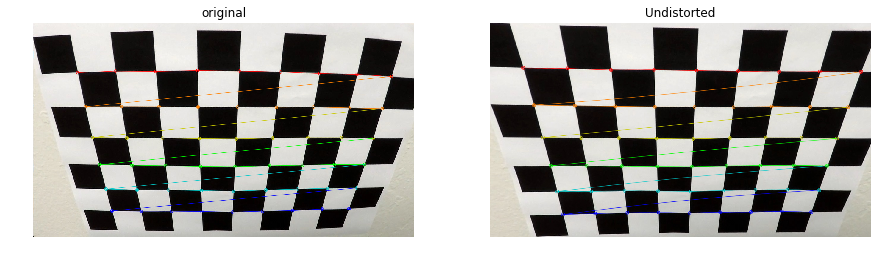

In [7]:
# Displaying example:

test_img = cv2.imread("camera_cal/calibration2.jpg")

test_gray = cv2.cvtColor(test_img, cv2.COLOR_BGR2GRAY)

test_shape = test_gray.shape[1::-1]
test_objp = np.zeros((ny * nx, 3), np.float32)
test_objp[:, :2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2)
test_imgpoints = []
test_objpoints = []
# Find the chessboard corners
ret, test_corners = cv2.findChessboardCorners(test_gray, (nx, ny), None)

# If found, draw corners
if(ret):
    test_imgpoints.append(test_corners)
    test_objpoints.append(test_objp)
    # Draw and display the corners
    cv2.drawChessboardCorners(test_img, (nx, ny), test_corners, ret)
fig, axs = plt.subplots(1,2, figsize=(15, 5))
axs = axs.ravel()

axs[0].axis('off')
axs[0].set_title('original')
axs[0].imshow(cv2.cvtColor(test_img,cv2.COLOR_BGR2RGB))

test_dst = cv2.undistort(test_img, mtx, dist, None, mtx)

axs[1].axis('off')
axs[1].set_title("Undistorted")
axs[1].imshow(cv2.cvtColor(test_dst,cv2.COLOR_BGR2RGB))

# Pre Processing 

## Step 1: Distortion Correction

In [8]:
def undistort(image,mtx,dst):
    dst_img = cv2.undistort(image, mtx, dist, None, mtx)
    return dst_img

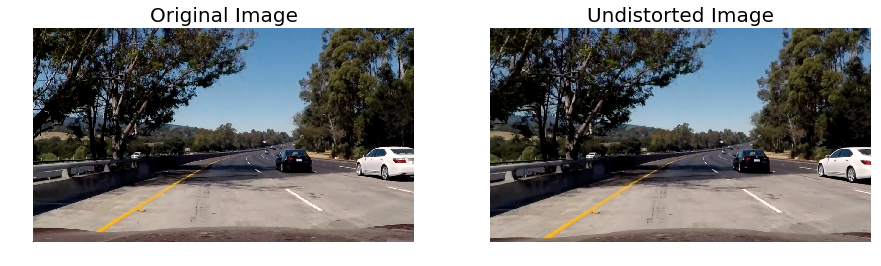

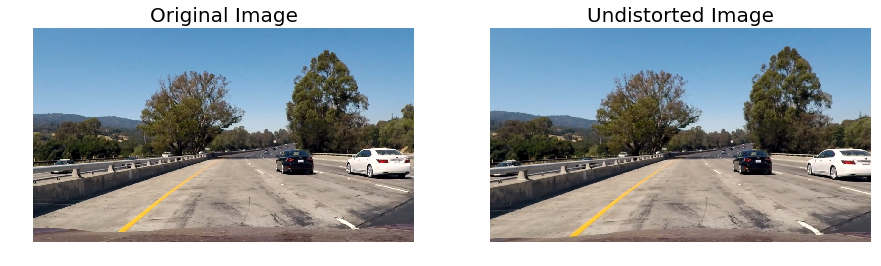

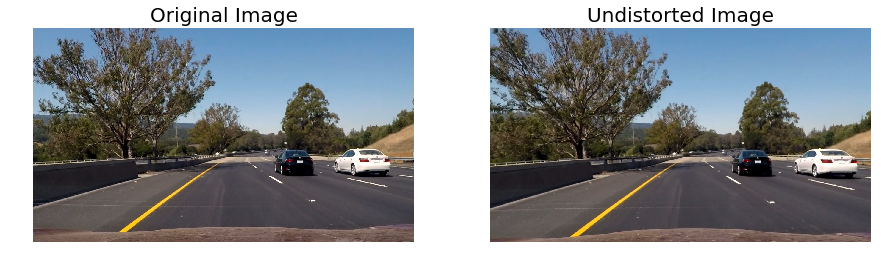

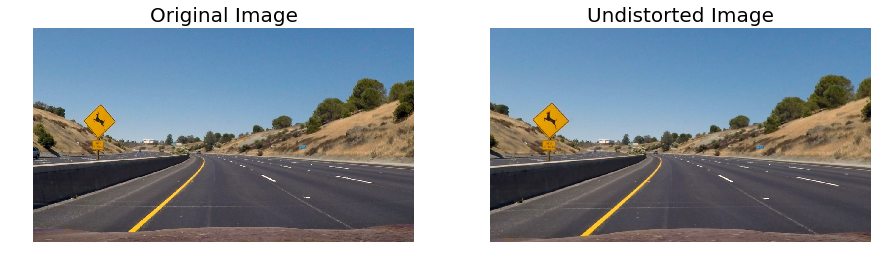

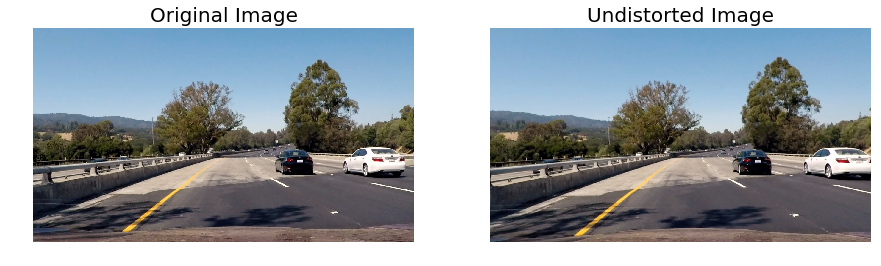

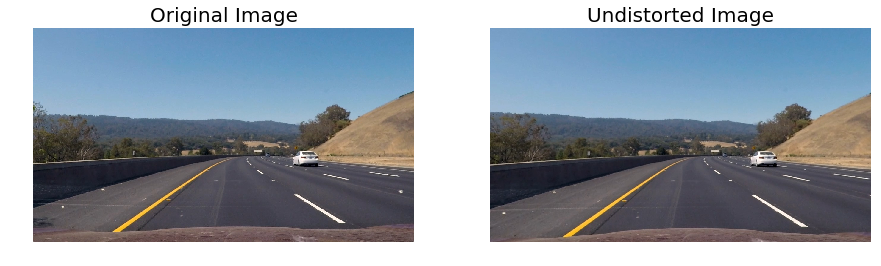

In [9]:
images = glob.glob('test_images/test*.jpg')

for i, img in enumerate(images):
    image = cv2.imread(img)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,5))
    ax1.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original Image', fontsize=20)
    ax1.axis('off')
    undist = undistort(image, mtx, dist)
    ax2.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
    ax2.set_title('Undistorted Image', fontsize=20)
    ax2.axis('off')

## Step 2: Pre-processing the image

Our aim is to find the lanes from the undistorted image.
To do this I have used the following techniques:

- **Colorspace Exploration**
  - HLS Colorspace
  - LAB Colorspace
  
  
- **Sobel Filtering**
  - X Direction
  - Y Direction
  - Absolute

### Helper Functions:

In [10]:
def cvtGray(img):
    return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

In [11]:
def selectChannel(image, channel):
    if(channel == 0):
        return image[:, :, 0]
    elif(channel == 1):
        return image[:, :, 1]
    elif(channel == 2):
        return image[:, :, 2]

In [12]:
def applyBinaryThresh(image, lower, upper, inverted=False):
    if (inverted):
        binary_output = np.ones_like(image)
        binary_output[((image > lower) & (image <= upper))] = 0
    else:
        binary_output = np.zeros_like(image)
        binary_output[((image > lower) & (image <= upper))] = 1

    return binary_output

In [13]:
def combineThresh(img1, img2):
    image = np.bitwise_or(img1, img2)
    return image

### HLS Colorspace

HLS color model A color model that defines colors by the three parameters hue (H), lightness (L), and saturation (S).
The HLS color model is represented by a double hexagonal cone, with white at the top apex and black at the bottom.

I used the  `cv2.cvtColor(image,cv2.COLOR_RGB2LAB)` function to convert the undistorted image to LAB Color Space.

![GitHub Logo](https://upload.wikimedia.org/wikipedia/commons/b/b3/HSL_color_solid_dblcone_chroma_gray.png)

In [14]:
def cvtHLS(image):
    return cv2.cvtColor(image, cv2.COLOR_BGR2HLS)

(-0.5, 1279.5, 719.5, -0.5)

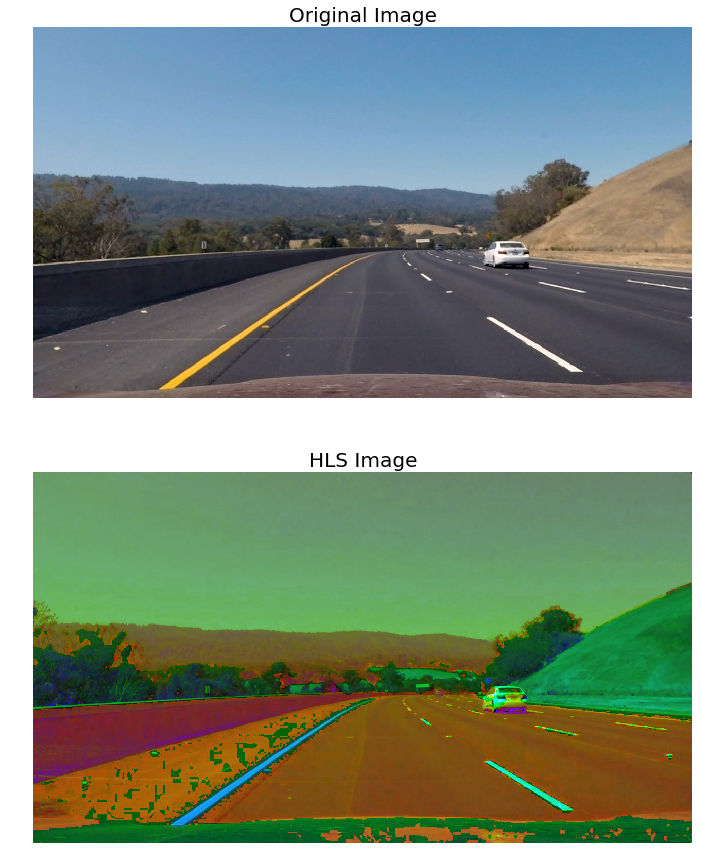

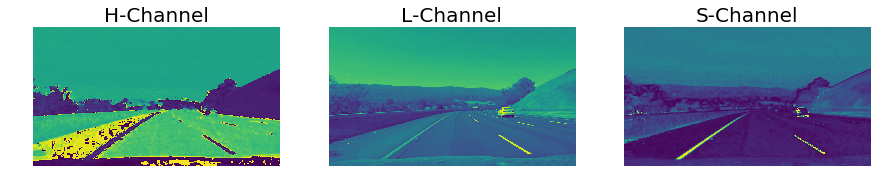

In [15]:
image = cv2.imread('test_images/test3.jpg')
undist = undistort(image, mtx, dist)
f1, (ax1, ax2) = plt.subplots(2, 1, figsize=(15,15))
f2, (ax3, ax4, ax5) = plt.subplots(1, 3, figsize=(15,15))
ax1.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
ax1.set_title('Original Image', fontsize=20)
ax1.axis('off')
hls = cvtHLS(image)
ax2.imshow(hls)
ax2.set_title('HLS Image', fontsize=20)
ax2.axis('off')
h_channel = selectChannel(hls, 0)
ax3.imshow(h_channel)
ax3.set_title('H-Channel', fontsize=20)
ax3.axis('off')
l_channel = selectChannel(hls, 1)
ax4.imshow(l_channel)
ax4.set_title('L-Channel', fontsize=20)
ax4.axis('off')
s_channel = selectChannel(hls, 2)
ax5.imshow(s_channel)
ax5.set_title('S-Channel', fontsize=20)
ax5.axis('off')

#### Selecting the S-Channel of HLS

We Can Observe that the line are most clear in S-channel and hence i applied thresholding to isolate the S-channel ans obtain a binary image of the same.

(-0.5, 1279.5, 719.5, -0.5)

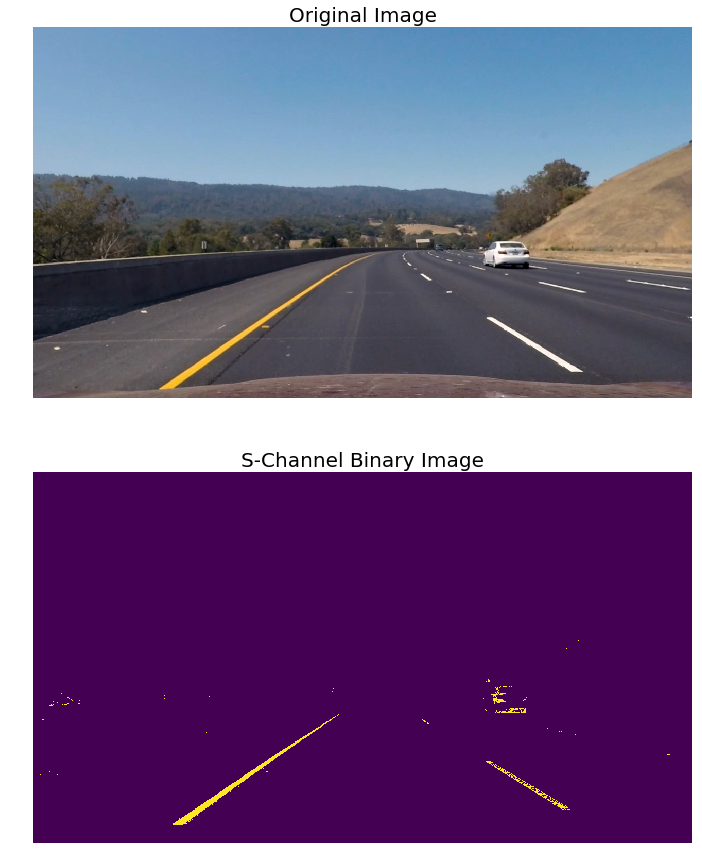

In [16]:
image = cv2.imread('test_images/test3.jpg')
undist = undistort(image, mtx, dist)
hls = cvtHLS(image)
f, (ax1, ax2) = plt.subplots(2, 1, figsize=(15,15))
ax1.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
ax1.set_title('Original Image', fontsize=20)
ax1.axis('off')
s_binary = (applyBinaryThresh(selectChannel(hls, 2), 175, 255))
ax2.imshow(s_binary)
ax2.set_title('S-Channel Binary Image', fontsize=20)
ax2.axis('off')

### LAB Colorspace

The Lab color space describes mathematically all perceivable colors in the three dimensions L for lightness and a and b for the color components green–red and blue–yellow

I used the  `cv2.cvtColor(image,cv2.COLOR_RGB2LAB)`  to convert the undistorted image to LAB Color Space.

![Lab Color Model](https://upload.wikimedia.org/wikipedia/commons/0/06/CIELAB_color_space_top_view.png)

In [17]:
def cvtLAB(image):
    return cv2.cvtColor(image, cv2.COLOR_RGB2LAB)

(-0.5, 1279.5, 719.5, -0.5)

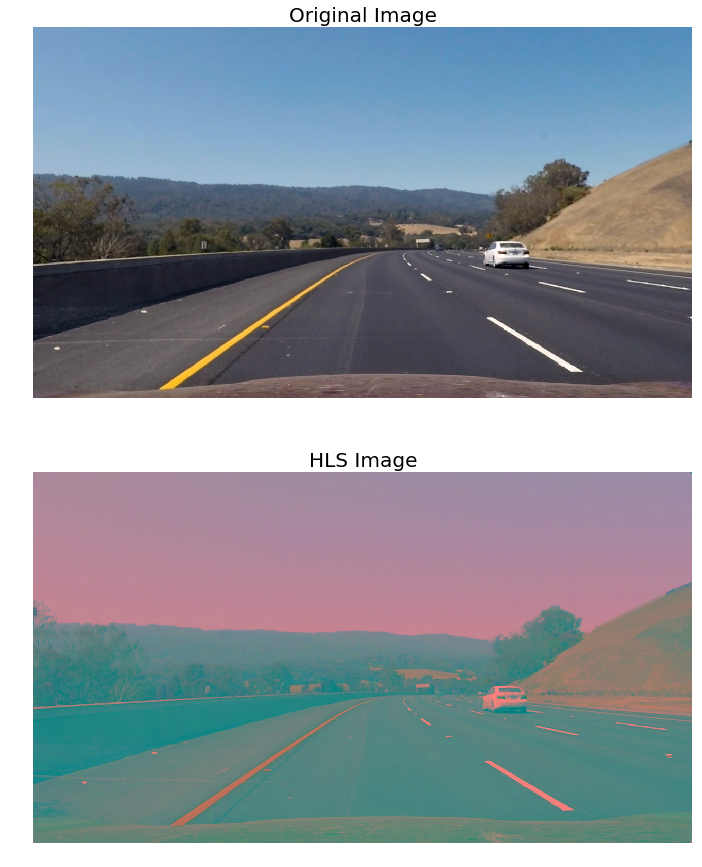

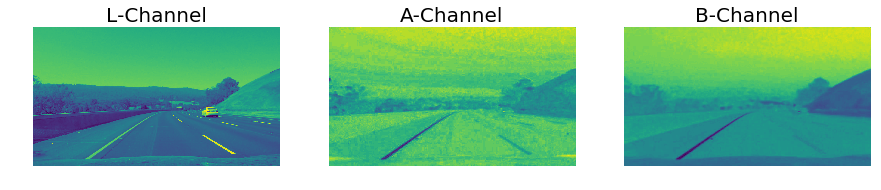

In [18]:
image = cv2.imread('test_images/test3.jpg')
undist = undistort(image, mtx, dist)
f1, (ax1, ax2) = plt.subplots(2, 1, figsize=(15,15))
f2, (ax3, ax4, ax5) = plt.subplots(1, 3, figsize=(15,15))
ax1.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
ax1.set_title('Original Image', fontsize=20)
ax1.axis('off')
lab = cvtLAB(image)
ax2.imshow(lab)
ax2.set_title('HLS Image', fontsize=20)
ax2.axis('off')
l_channel = selectChannel(lab, 0)
ax3.imshow(l_channel)
ax3.set_title('L-Channel', fontsize=20)
ax3.axis('off')
a_channel = selectChannel(lab, 1)
ax4.imshow(a_channel)
ax4.set_title('A-Channel', fontsize=20)
ax4.axis('off')
b_channel = selectChannel(lab, 2)
ax5.imshow(b_channel)
ax5.set_title('B-Channel', fontsize=20)
ax5.axis('off')

#### Selecting the B-Channel of LAB
We Can Observe that the line are most clear in L-channel and hence i applied thresholding to isolate the L-channel ans obtain a binary image of the same

(-0.5, 1279.5, 719.5, -0.5)

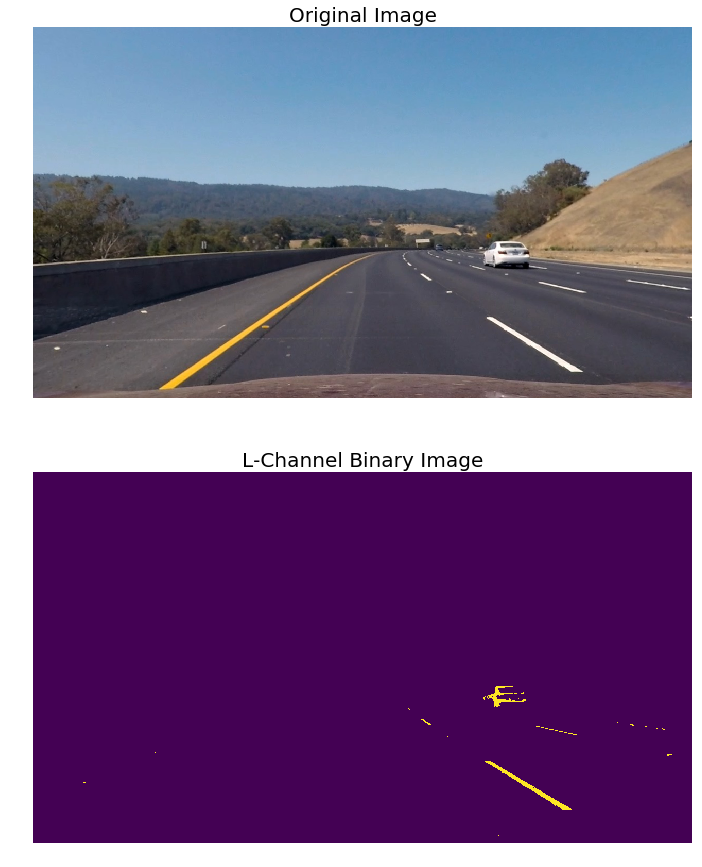

In [32]:
image = cv2.imread('test_images/test3.jpg')
undist = undistort(image, mtx, dist)
hls = cvtHLS(image)
f, (ax1, ax2) = plt.subplots(2, 1, figsize=(15,15))
ax1.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
ax1.set_title('Original Image', fontsize=20)
ax1.axis('off')
l_binary = (applyBinaryThresh(selectChannel(lab, 0), 225, 255, False))
ax2.imshow(b_binary)
ax2.set_title('L-Channel Binary Image', fontsize=20)
ax2.axis('off')

#### Combining S-Channel and B-Channel Thresholds
Now I combined the S-channel binary and B-channel Binary images to obtain a combined Thresholdinng.

(-0.5, 1279.5, 719.5, -0.5)

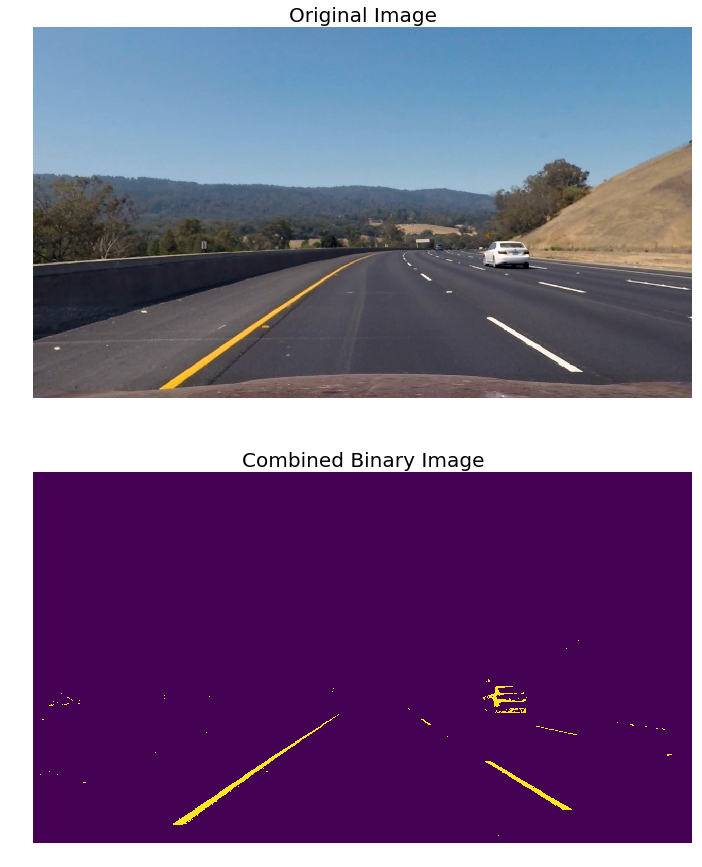

In [33]:
image = cv2.imread('test_images/test3.jpg')
undist = undistort(image, mtx, dist)
hls = cvtHLS(image)
f, (ax1, ax2) = plt.subplots(2, 1, figsize=(15,15))
ax1.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
ax1.set_title('Original Image', fontsize=20)
ax1.axis('off')
color = combineThresh(l_binary, s_binary) * 255
ax2.imshow(color)
ax2.set_title('Combined Binary Image', fontsize=20)
ax2.axis('off')


### Sobel Filtering
The Sobel operator performs a 2-D spatial gradient measurement on an image and so emphasizes regions of high spatial frequency that correspond to edges. Typically it is used to find the approximate absolute gradient magnitude at each point in an input grayscale image.

I applied Sobel Filter in X-direction and Y-direction and the combines them to get the Absolute.

In [34]:
def absSobel(image, lower, upper, orient='x'):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    scaled_sobel = np.uint8(255 * abs_sobel / np.max(abs_sobel))
    sobel_binary = applyBinaryThresh(scaled_sobel, lower, upper)
    return sobel_binary

#### Sobel X

(-0.5, 1279.5, 719.5, -0.5)

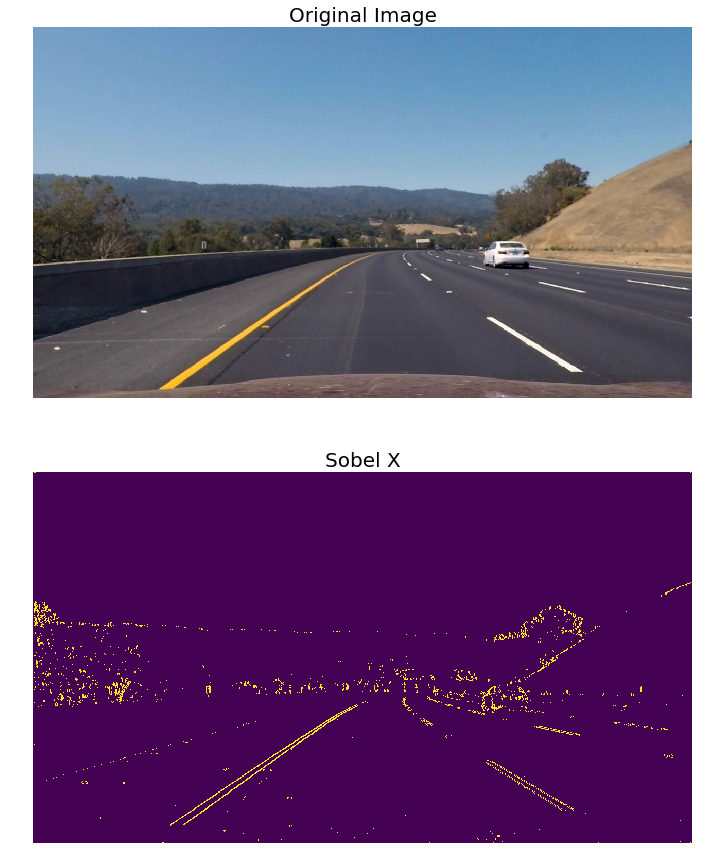

In [35]:
image = cv2.imread('test_images/test3.jpg')
undist = undistort(image, mtx, dist)
f, (ax1, ax2) = plt.subplots(2, 1, figsize=(15,15))
ax1.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
ax1.set_title('Original Image', fontsize=20)
ax1.axis('off')
sobel_x = absSobel(image, 30, 110, 'x') * 255
ax2.imshow(sobel_x)
ax2.set_title('Sobel X', fontsize=20)
ax2.axis('off')


#### Sobel Y

(-0.5, 1279.5, 719.5, -0.5)

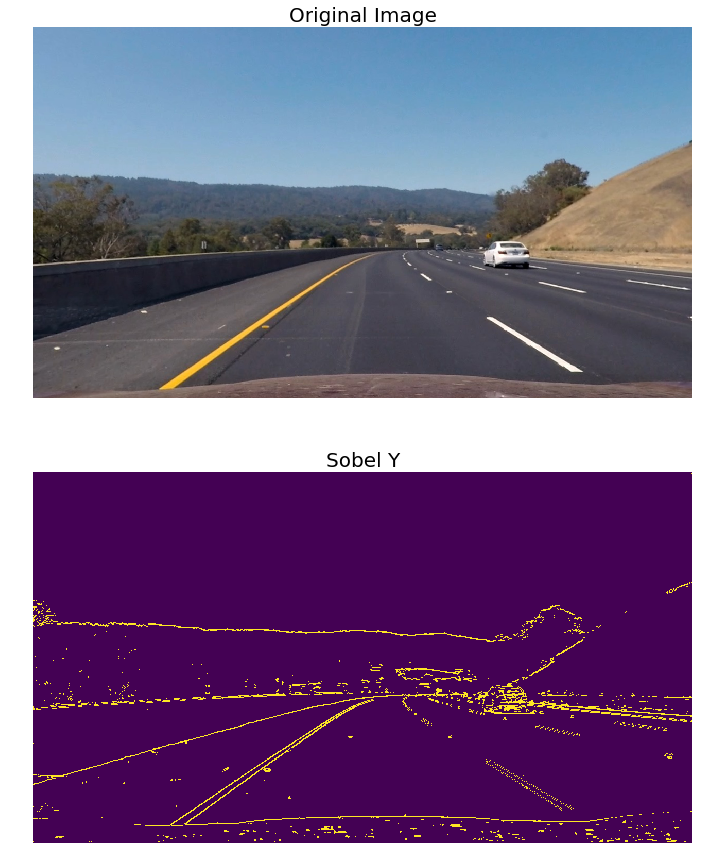

In [36]:
image = cv2.imread('test_images/test3.jpg')
undist = undistort(image, mtx, dist)
f, (ax1, ax2) = plt.subplots(2, 1, figsize=(15,15))
ax1.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
ax1.set_title('Original Image', fontsize=20)
ax1.axis('off')
sobel_y = absSobel(image, 30, 110, 'y') * 255
ax2.imshow(sobel_y)
ax2.set_title('Sobel Y', fontsize=20)
ax2.axis('off')



#### Sobel ABS

(-0.5, 1279.5, 719.5, -0.5)

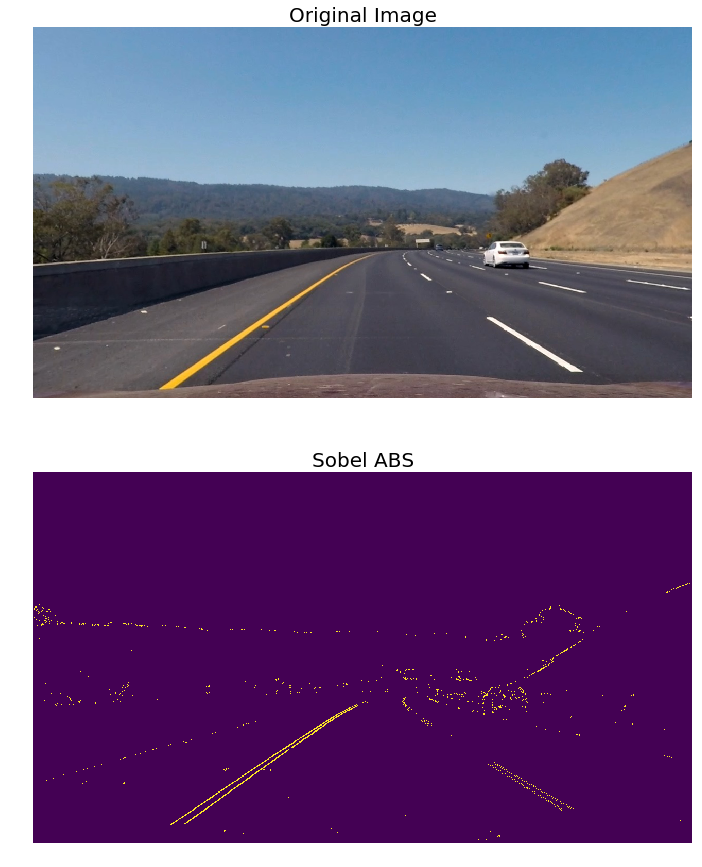

In [37]:
image = cv2.imread('test_images/test3.jpg')
undist = undistort(image, mtx, dist)
f, (ax1, ax2) = plt.subplots(2, 1, figsize=(15,15))
ax1.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
ax1.set_title('Original Image', fontsize=20)
ax1.axis('off')
sobel_abs = np.bitwise_and(sobel_x, sobel_y)
ax2.imshow(sobel_abs)
ax2.set_title('Sobel ABS', fontsize=20)
ax2.axis('off')


### Combining Color threshold with Sobel threshold

Now I combine the sobel thresholding and the HLS and LAB thresholding into a pre-processing pipeline. 
I chose to create this combined binary threshold based on the three above mentioned binary thresholds, to create one combination thresholded image which does a great job of highlighting almost all of the white and yellow lane lines.

(-0.5, 1279.5, 719.5, -0.5)

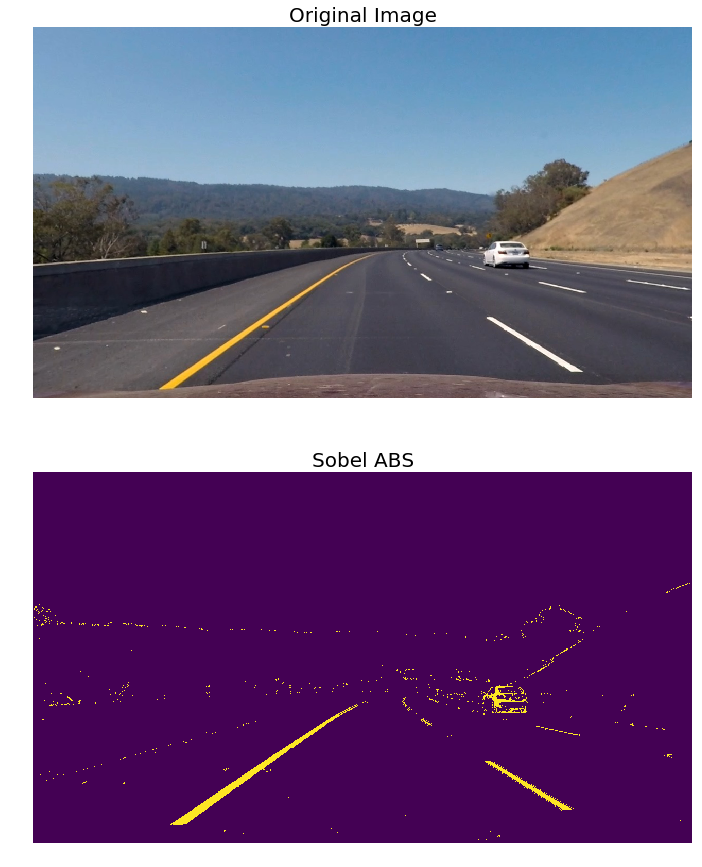

In [38]:
image = cv2.imread('test_images/test3.jpg')
undist = undistort(image, mtx, dist)
f, (ax1, ax2) = plt.subplots(2, 1, figsize=(15,15))
ax1.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
ax1.set_title('Original Image', fontsize=20)
ax1.axis('off')
combined = combineThresh(color, sobel_abs)
ax2.imshow(combined)
ax2.set_title('Sobel ABS', fontsize=20)
ax2.axis('off')


### The Pre-processing Pipeline

In [49]:
def preProcess(image):
    hls_image = cvtHLS(image)
    lab_image = cvtLAB(image)
    b_binary = (applyBinaryThresh(selectChannel(lab_image, 0), 225, 255, False))
    # l_binary = (applyBinaryThresh(selectChannel(hls_image, 1), 100, 240))
    s_binary = (applyBinaryThresh(selectChannel(hls_image, 2), 175, 255))

    color = combineThresh(b_binary, s_binary) * 255
    sobel_x = absSobel(image, 30, 110, 'x') * 255
    sobel_y = absSobel(image, 30, 110, 'y') * 255
    sobel_abs = np.bitwise_and(sobel_x, sobel_y)
    combined = combineThresh(color, sobel_abs)
    return combined

## Step 3: Region of Interest

Even though the combine binary thresholding does an amazing job at highlighting the lane lines there are still some features in the image which are not going to htlp us in detecting the lanes and can be treated as added noise.
Applying the ROI mask helps us to eliminate these unwanted features and as we know that the lanes will always lie more or less in this region we can confidently eliminate the unwanted background.

The following steps help us to select the ROI:
 - Defining ROI
 - Applying ROI mask

### Defining ROI

In [50]:
def drawROI(image, pts):
    pts = pts.reshape((-1, 1, 2))
    cv2.polylines(image, [pts], True, (0, 0, 255),5)

# Defining ROI Points
roi_pts = np.array([[190, 700], [580, 450], [730, 450], [1160, 700]], np.int32)

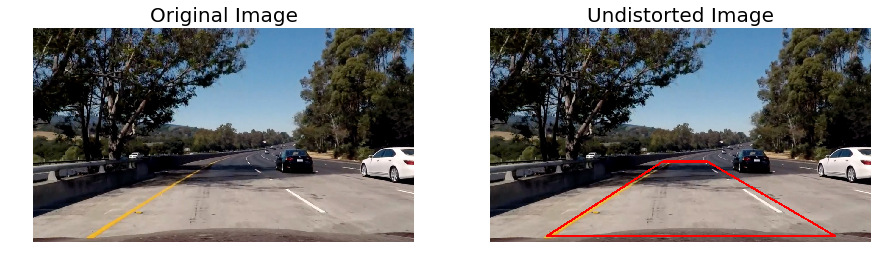

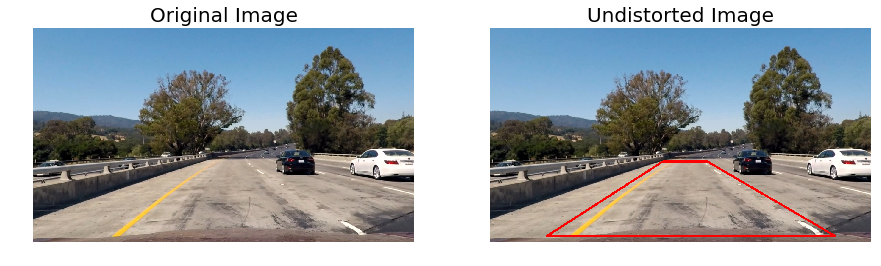

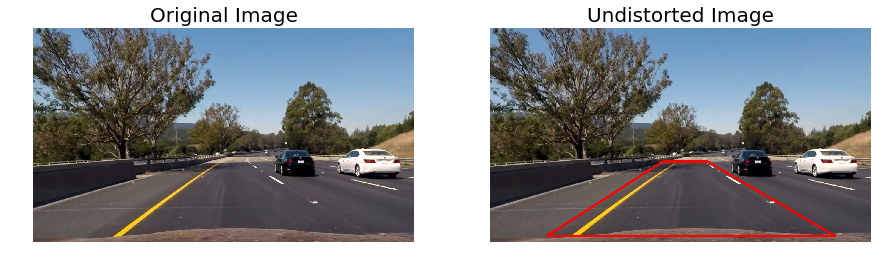

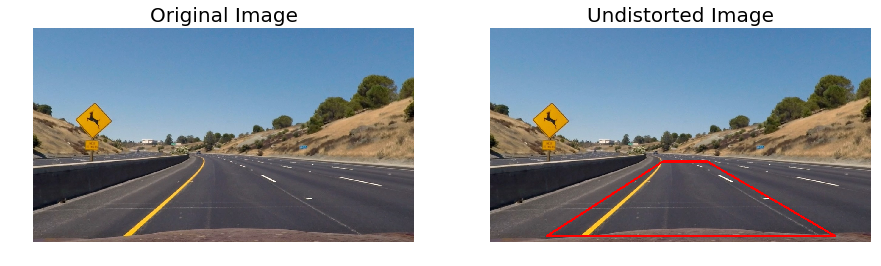

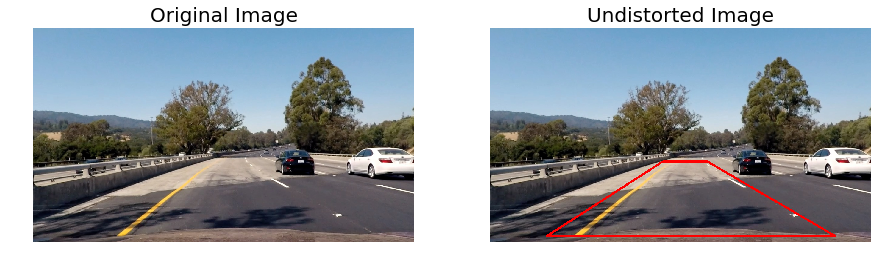

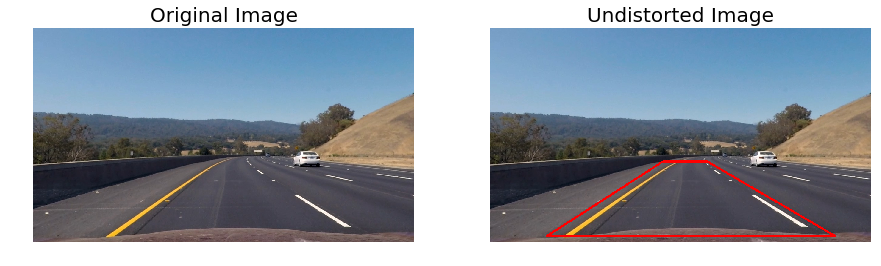

In [51]:
images = glob.glob('test_images/test*.jpg')

for i, img in enumerate(images):
    image = cv2.imread(img)
    undist = undistort(image, mtx, dist)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,5))
    ax1.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original Image', fontsize=20)
    ax1.axis('off')
    drawROI(undist, roi_pts)
    ax2.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
    ax2.set_title('Undistorted Image', fontsize=20)
    ax2.axis('off')

### Applying ROI mask (With pre-processing)

In [52]:
def selectROI(image, pts):
    mask = np.zeros_like(image)
    cv2.fillPoly(mask, [pts], (255,) * 3)
    return np.bitwise_and(mask, image)

(-0.5, 1279.5, 719.5, -0.5)

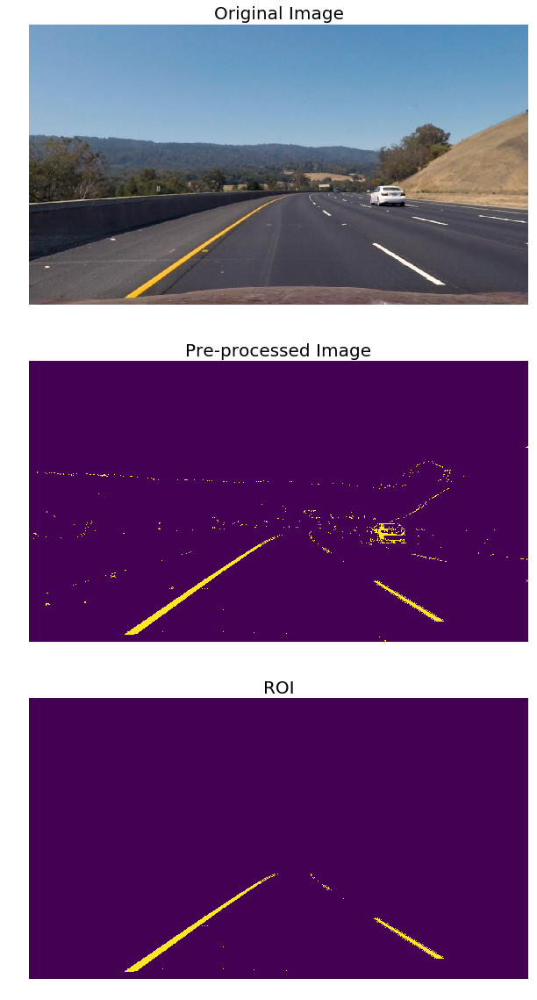

In [53]:
image = cv2.imread('test_images/test3.jpg')
undist = undistort(image, mtx, dist)
f, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(15,20))
ax1.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
ax1.set_title('Original Image', fontsize=20)
ax1.axis('off')
combined = preProcess(undist)
ax2.imshow(combined)
ax2.set_title('Pre-processed Image', fontsize=20)
ax2.axis('off')
roi = selectROI(combined, roi_pts)
ax3.imshow(roi)
ax3.set_title('ROI', fontsize=20)
ax3.axis('off')

## Step 4: Perspective Transform

In this step I will define a function Warp() which transforms the undistorted image to a "birds eye view" of the road which focuses only on the lane lines and displays them in such a way that they appear to be relatively parallel to eachother. This will make it easier later on to fit polynomials to the lane lines and measure the curvature.

In [54]:
def warp(image):
    img_size = (int(image.shape[1]), int(image.shape[0]))
    # print img_size
    src = np.array([[190, 700], [580, 450], [
                   730, 450], [1160, 700]], np.float32)
    dst = np.array([[380, 720], [380, 10], [950, 10], [950, 720]], np.float32)
    # Given src and dst points, calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(image, M, img_size)

    # Return the resulting image and matrix
    return warped

def unwarp(image, img_size):
    # img_size = (int(image.shape[1]), int(image.shape[0]))
    # print img_size
    src = np.array([[190, 700], [580, 450], [
                   730, 450], [1160, 700]], np.float32)
    dst = np.array([[380, 720], [380, 10], [950, 10], [950, 720]], np.float32)
    # Given src and dst points, calculate the perspective transform matrix
    Minv = cv2.getPerspectiveTransform(dst, src)
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(image, Minv, img_size)

    # Return the resulting image and matrix
    return warped

**Mapping Coordinates**

Source|Destination
------|-----------
[190, 700]|[380, 720] 
[580, 450]|[380, 10]
[730, 450]|[950, 10] 
[1160, 700]|[950, 720]

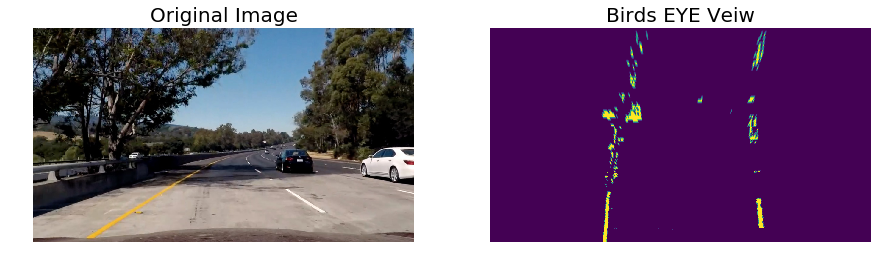

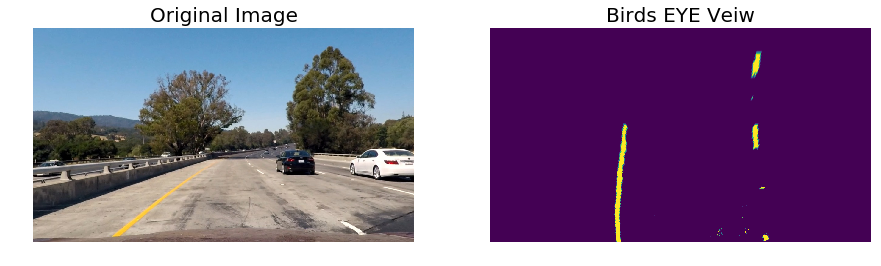

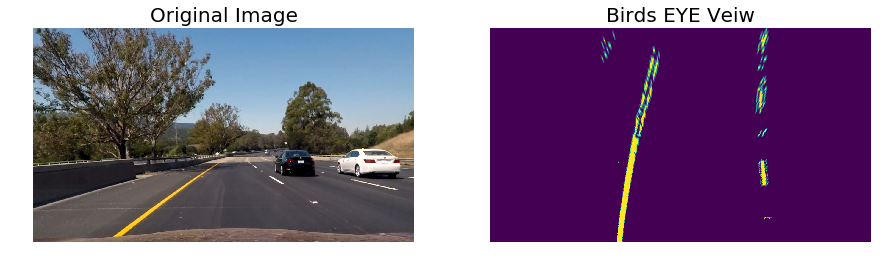

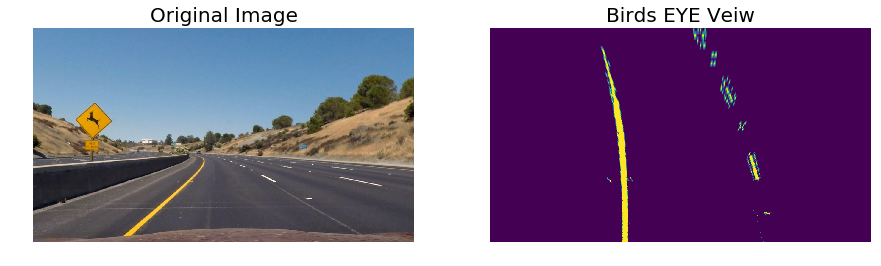

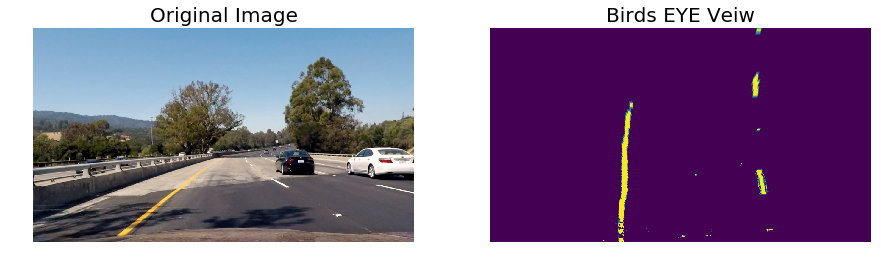

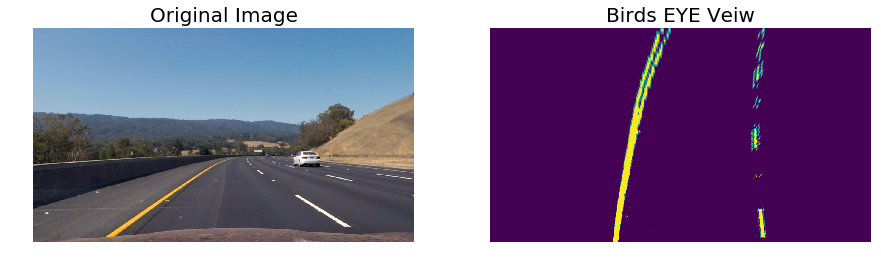

In [55]:
for i, img in enumerate(images):
    image = cv2.imread(img)
    undist = undistort(image, mtx, dist)
    combined = preProcess(undist)
    roi = selectROI(combined, roi_pts)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,5))
    ax1.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original Image', fontsize=20)
    ax1.axis('off')
    warped = warp(roi)
    ax2.imshow(warped)
    ax2.set_title('Birds EYE Veiw', fontsize=20)
    ax2.axis('off')

## Finding Lanes

At this point I was able to use the combined binary image to isolate lane line pixels and fit a polynomial to each of the lane lines. The space in between the identified lane lines is filled in to highlight the driveable area in the lane. The position of the vehicle was measured by taking the average of the x intercepts of each line.

The next step was to fit a polynomial to each lane line, which was done by:

 - Identifying peaks in a histogram of the image to determine location of lane lines.
 - Identifying all non zero pixels around histogram peaks using the numpy function numpy.nonzero().
 - Fitting a polynomial to each lane using the numpy function numpy.polyfit().

The **Sliding Window Search** and **Neighbouring Search** help us to do the above mentioned steps.
These functions are described below.

### Sliding Window Search

In [73]:
def sliding_window_search(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[int(binary_warped.shape[0]) // 2:, :], axis=0)
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0] / 2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0] / nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    # Rectangle data for visualization
    rectangle_data = []
    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window + 1) * window_height
        win_y_high = binary_warped.shape[0] - window * window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        rectangle_data.append((win_y_low, win_y_high, win_xleft_low,
                               win_xleft_high, win_xright_low, win_xright_high))
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &
                          (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &
                           (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    left_fit, right_fit = (None, None)
    # Fit a second order polynomial to each
    if len(leftx) != 0:
        left_fit = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
        right_fit = np.polyfit(righty, rightx, 2)

    visualization_data = [rectangle_data, histogram, binary_warped]

    return leftx, rightx, lefty, righty, left_fit, right_fit, visualization_data

In [74]:
# Sliding Window search visualization
def showSWsearch(leftx, rightx, lefty, righty, left_fit, right_fit, visualization_data):
    ploty = np.linspace(
        0, visualization_data[2].shape[0] - 1, visualization_data[2].shape[0])
    left_fitx = left_fit[0] * ploty**2 + left_fit[1] * ploty + left_fit[2]
    right_fitx = right_fit[0] * ploty**2 + right_fit[1] * ploty + right_fit[2]

    out_img = np.dstack(
        (visualization_data[2], visualization_data[2], visualization_data[2])) * 255
#     nonzero = visualization_data[2].nonzero()
#     nonzeroy = np.array(nonzero[0])
#     nonzerox = np.array(nonzero[1])
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

#     leftp = str(zip(left_fitx, ploty))
#     leftp = np.array([leftp], dtype=np.int32)

#     rightp = str(zip(right_fitx, ploty))
#     rightp = np.array([rightp], dtype=np.int32)

    rectangles = visualization_data[0]
    for rect in rectangles:
        cv2.rectangle(out_img, (rect[2], rect[0]), (rect[3], rect[1]),
                      (0, 255, 0), 2)
        cv2.rectangle(out_img, (rect[4], rect[0]), (rect[5], rect[1]),
                      (0, 255, 0), 2)

#     cv2.polylines(out_img, leftp, False, color=[0, 255, 0],
#                   thickness=3, lineType=8, shift=0)
#     cv2.polylines(out_img, rightp, False, color=[0, 255, 0],
#                   thickness=3, lineType=8, shift=0)

    #cv2.imshow("out", out_img)
    graph_data = [left_fitx, right_fitx]
    return out_img, graph_data 

(-0.5, 1279.5, 719.5, -0.5)

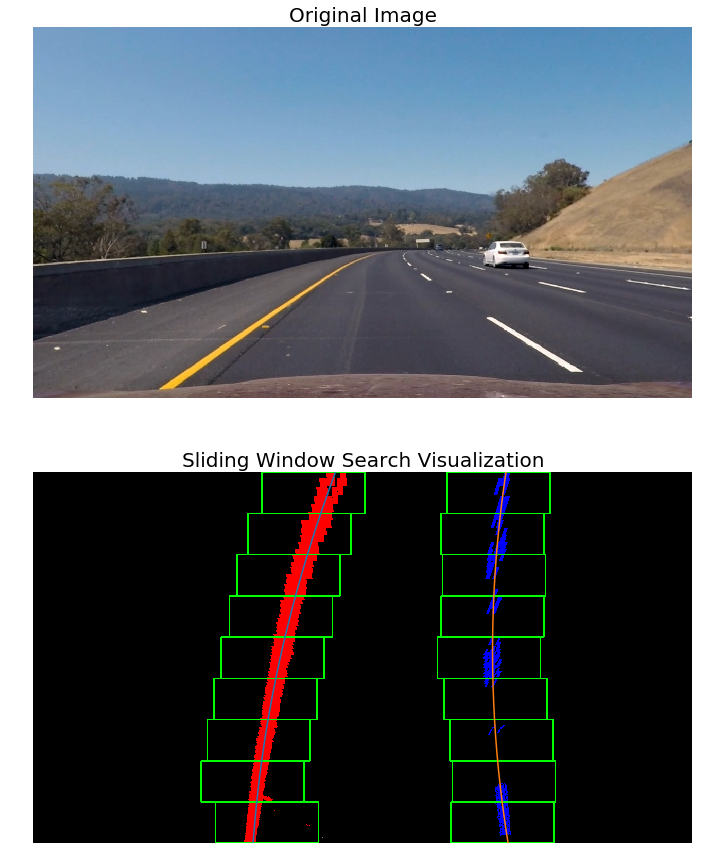

In [75]:
# Displaying Visualization
expImg = cv2.imread('test_images/test3.jpg')
undist = undistort(expImg, mtx, dist)
combined = preProcess(undist)
roi = selectROI(combined, roi_pts)
warped = warp(roi)
leftx, rightx, lefty, righty, left_fit, right_fit, visualization_data = sliding_window_search(warped)
f, (ax1, ax2) = plt.subplots(2, 1, figsize=(15,15))
ax1.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
ax1.set_title('Original Image', fontsize=20)
ax1.axis('off')
out_img,graph_data = showSWsearch(leftx, rightx, lefty, righty, left_fit, right_fit, visualization_data)
ploty = np.linspace(0, visualization_data[2].shape[0] - 1, visualization_data[2].shape[0])
ax2.imshow(out_img)
ax2.plot(graph_data[0],ploty)
ax2.plot(graph_data[1],ploty)
ax2.set_title('Sliding Window Search Visualization', fontsize=20)
ax2.axis('off')

### Neighbouring Search

In [76]:
def swNeighbourSearch(binary_warped, left_fit, right_fit):
    # from the next frame of video (also called "binary_warped")
    # It's now much easier to find line pixels!
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy +
    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) +
    left_fit[1]*nonzeroy + left_fit[2] + margin)))

    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy +
    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) +
    right_fit[1]*nonzeroy + right_fit[2] + margin)))

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    visualization_data = [binary_warped, margin]
    left_fit, right_fit = (None, None)
    # Fit a second order polynomial to each
    if len(leftx) != 0:
        left_fit = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
        right_fit = np.polyfit(righty, rightx, 2)

    return leftx, rightx, lefty, righty, left_fit, right_fit, visualization_data

In [77]:
# Neighbouring Search Visualization
def showNeighbourSearch(leftx, rightx, lefty, righty, left_fit, right_fit, visualization_data):
    # Create an image to draw on and an image to show the selection window
    binary_warped = visualization_data[0]
    out_img = np.dstack((binary_warped, binary_warped, binary_warped)) * 255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0] - 1, binary_warped.shape[0])
    left_fitx = left_fit[0] * ploty ** 2 + left_fit[1] * ploty + left_fit[2]
    right_fitx = right_fit[0] * ploty ** 2 + right_fit[1] * ploty + right_fit[2]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    margin = visualization_data[1]
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx - margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx + margin,
                                  ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx - margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx + margin,
                                  ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0, 255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0, 255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    return result
#     cv2.imshow("result", result)

(-0.5, 1279.5, 719.5, -0.5)

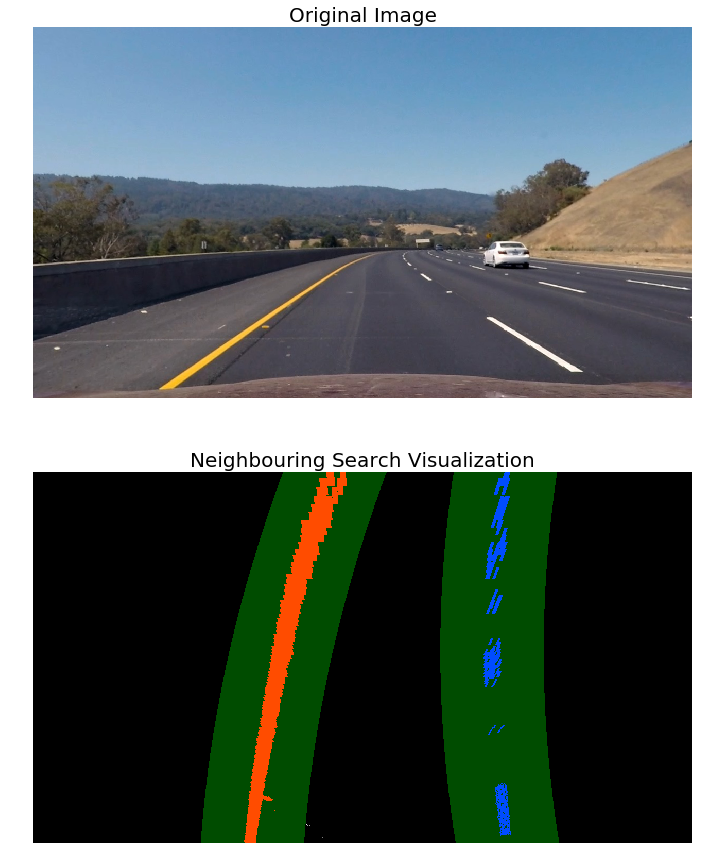

In [78]:
# Displaying Visualization
expImg = cv2.imread('test_images/test3.jpg')
undist = undistort(expImg, mtx, dist)
combined = preProcess(undist)
roi = selectROI(combined, roi_pts)
warped = warp(roi)
leftx, rightx, lefty, righty, left_fit, right_fit, visualization_data = sliding_window_search(warped)
leftx, rightx, lefty, righty, left_fit, right_fit, visualization_data = swNeighbourSearch(warped, left_fit, right_fit)
f, (ax1, ax2) = plt.subplots(2, 1, figsize=(15,15))
ax1.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
ax1.set_title('Original Image', fontsize=20)
ax1.axis('off')
result = showNeighbourSearch(leftx, rightx, lefty, righty, left_fit, right_fit, visualization_data)
ax2.imshow(result)
ax2.set_title('Neighbouring Search Visualization', fontsize=20)
ax2.axis('off')

## Finding Curvature

After fitting the polynomials I was able to calculate the position of the vehicle with respect to center with the following calculations:

- Calculated the average of the x intercepts from each of the two polynomials position = (rightx_int+leftx_int)/2.

- Calculated the distance from center by taking the absolute value of the vehicle position minus the halfway point along the horizontal axis distance_from_center = abs(image_width/2 - position)

- If the horizontal position of the car was greater than image_width/2 than the car was considered to be left of center, otherwise right of center.


Finally, the distance from center was converted from pixels to meters by multiplying the number of pixels by 3.7/700.
Next I used the following code to calculate the radius of curvature for each lane line in meters.
The final radius of curvature was taken by average the left and right curve radiuses.

In [79]:
def findCurvature(binary_warped, leftx, rightx, lefty, righty, r_fit_x_int, l_fit_x_int):
    ploty = np.linspace(0, binary_warped.shape[0] - 1, binary_warped.shape[0])
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 0.04285   # meters per pixel in y dimension
    xm_per_pix = 0.005285  # meters per pixel in x dimension
    y_eval = np.max(ploty)
    if len(leftx) != 0 and len(rightx) != 0:
        # Fit new polynomials to x,y in world space
        left_fit_cr = np.polyfit(lefty * ym_per_pix, leftx * xm_per_pix, 2)
        right_fit_cr = np.polyfit(righty * ym_per_pix, rightx * xm_per_pix, 2)

        left_curverad = ((1 + (2 * left_fit_cr[0] * y_eval * ym_per_pix + left_fit_cr[1]) ** 2) ** 1.5) / np.absolute(2 * left_fit_cr[0])
        right_curverad = ((1 + (2 * right_fit_cr[0] * y_eval * ym_per_pix + right_fit_cr[1]) ** 2) ** 1.5) / np.absolute(2 * right_fit_cr[0])
    # print(left_curverad, right_curverad)
    if left_fit_cr is not None and right_fit_cr is not None:
        car_position = binary_warped.shape[1] / 2
        h = binary_warped.shape[0]
        # l_fit_x_int = left_fit_cr[0]*h**2 + left_fit_cr[1]*h + left_fit_cr[2]
        # r_fit_x_int = right_fit_cr[0]*h**2 + right_fit_cr[1]*h + right_fit_cr[2]
        lane_center_position = (r_fit_x_int + l_fit_x_int) /2
        center_dist = (car_position - lane_center_position) * xm_per_pix

    return left_curverad, right_curverad, center_dist

## Visual Display of the Lane Boundaries and Numerical Estimation

I used the following functions to help me visualize the detected data (i.e, the detected drivable region between the lanes and the measure of curvature of the lane) back on to the original image/frame.

In [83]:
def draw_data(original_img, curv_rad, center_dist):
    new_img = np.copy(original_img)
    # h = new_img.shape[0]
    font = cv2.FONT_HERSHEY_DUPLEX
    text = 'Curve radius: ' + '{:04.2f}'.format(curv_rad) + 'm'
    cv2.putText(new_img, text, (40, 70), font, 1.5, (200, 255, 155), 2, cv2.LINE_AA)
    direction = ''
    if center_dist > 0:
        direction = 'right'
    elif center_dist < 0:
        direction = 'left'
    abs_center_dist = abs(center_dist)
    text = '{:04.3f}'.format(abs_center_dist) + 'm ' + direction + ' of center'
    cv2.putText(new_img, text, (40, 120), font, 1.5, (200, 255, 155), 2, cv2.LINE_AA)
    return new_img

In [97]:
def unwarp(image, img_size):
    # img_size = (int(image.shape[1]), int(image.shape[0]))
    # print img_size
    src = np.array([[190, 700], [580, 450], [
                   730, 450], [1160, 700]], np.float32)
    dst = np.array([[380, 720], [380, 10], [950, 10], [950, 720]], np.float32)
    # Given src and dst points, calculate the perspective transform matrix
    Minv = cv2.getPerspectiveTransform(dst, src)
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(image, Minv, img_size)

    # Return the resulting image and matrix
    return warped

In [98]:
def drawLane(warped, left_fit, right_fit, image_shape, undist):
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    ploty = np.linspace(0, warped.shape[0] - 1, warped.shape[0])
    left_fitx = left_fit[0] * ploty ** 2 + left_fit[1] * ploty + left_fit[2]
    right_fitx = right_fit[0] * ploty ** 2 + right_fit[1] * ploty + right_fit[2]

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = unwarp(color_warp, image_shape)
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    # cv2.imshow("lane", result)
    return result

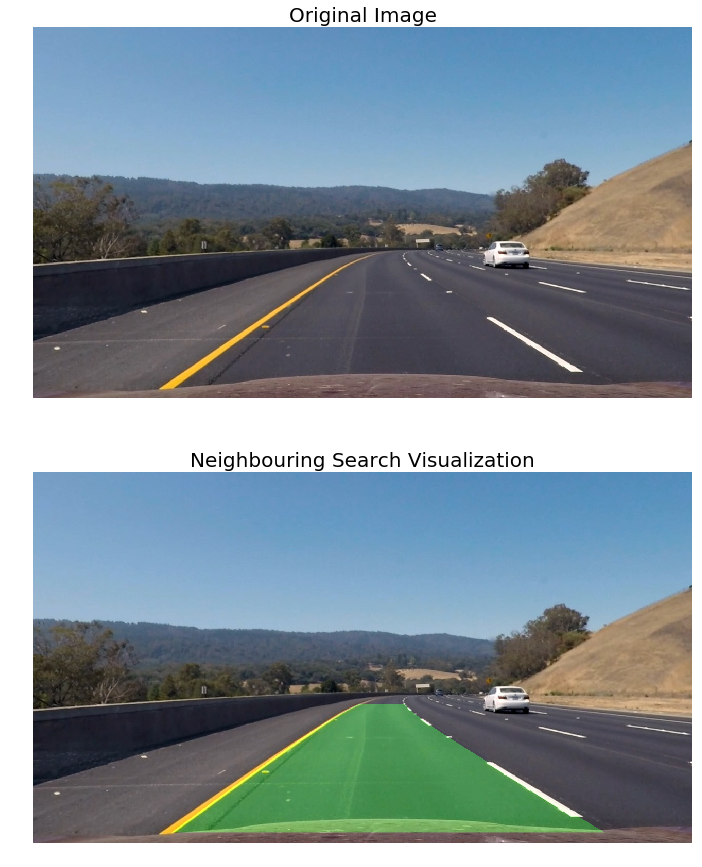

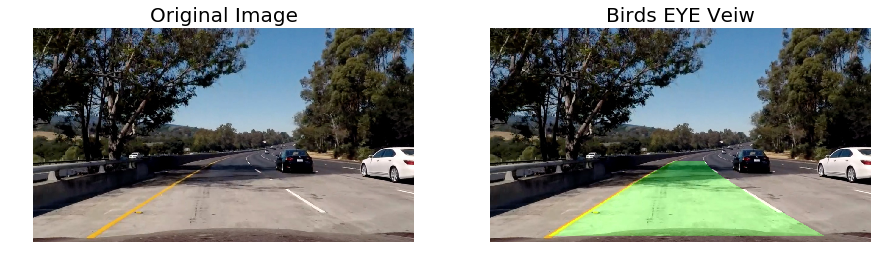

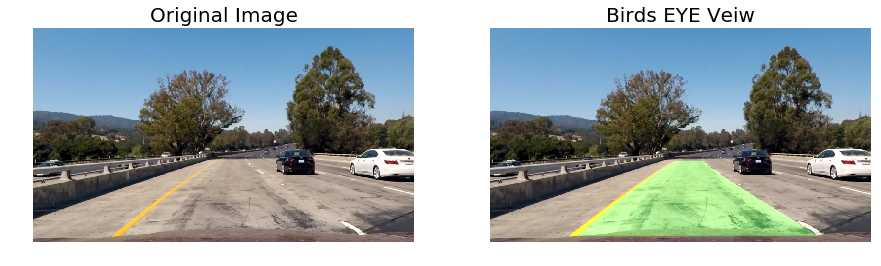

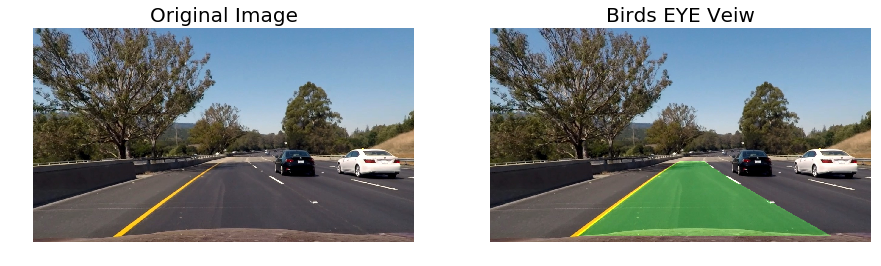

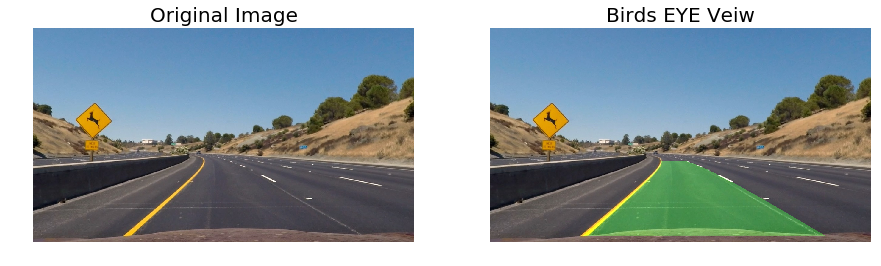

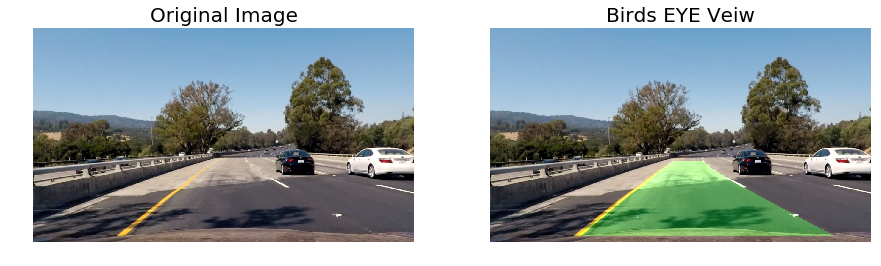

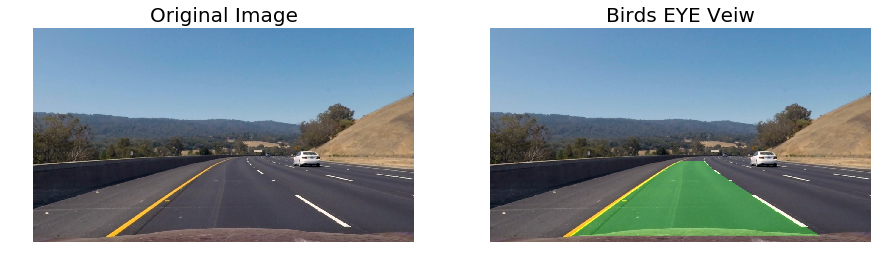

In [99]:
# Displaying Visualization
expImg = cv2.imread('test_images/test3.jpg')
img_size = (int(expImg.shape[1]), int(expImg.shape[0]))
undist = undistort(expImg, mtx, dist)
combined = preProcess(undist)
roi = selectROI(combined, roi_pts)
warped = warp(roi)
leftx, rightx, lefty, righty, left_fit, right_fit, visualization_data = sliding_window_search(warped)
leftx, rightx, lefty, righty, left_fit, right_fit, visualization_data = swNeighbourSearch(warped, left_fit, right_fit)
f, (ax1, ax2) = plt.subplots(2, 1, figsize=(15,15))
ax1.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
ax1.set_title('Original Image', fontsize=20)
ax1.axis('off')
result = drawLane(warped, left_fit, right_fit, img_size, undist)
ax2.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
ax2.set_title('Neighbouring Search Visualization', fontsize=20)
ax2.axis('off')

for i, img in enumerate(images):
    expImg = cv2.imread(img)
    img_size = (int(expImg.shape[1]), int(expImg.shape[0]))
    undist = undistort(expImg, mtx, dist)
    combined = preProcess(undist)
    roi = selectROI(combined, roi_pts)
    warped = warp(roi)
    leftx, rightx, lefty, righty, left_fit, right_fit, visualization_data = sliding_window_search(warped)
    leftx, rightx, lefty, righty, left_fit, right_fit, visualization_data = swNeighbourSearch(warped, left_fit, right_fit)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,5))
    ax1.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original Image', fontsize=20)
    ax1.axis('off')
    result = drawLane(warped, left_fit, right_fit, img_size, undist)
    ax2.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
    ax2.set_title('Birds EYE Veiw', fontsize=20)
    ax2.axis('off')

## The Lane Finding Pipeline
We are now all set to define the Lane Finding Pipeline....!!

### The Line Class
I defined a class called Line() to keep track of all the interesting parameters you measure from frame to frame. 

the Line() class also has a function called addFit() which performs a sanity check before we consider a detection to be a valid detection.
To perform this sanity check I compared the newest detection (fit) to the previously detected best fit and if it is in the defined bounds the newest fit get appended to the list of valid fits.

The best fit is then calculated as the average of the most recent 8 valid fits.

I also store the best fits for future.

In [86]:
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False
        # x values of the last n fits of the line
        self.recent_xfitted = []
        # average x values of the fitted line over the last n iterations
        self.bestx = []
        # polynomial coefficients averaged over the last n iterations
        self.best_fit = None
        # polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]
        # radius of curvature of the line in some units
        self.radius_of_curvature = None
        # distance in meters of vehicle center from the line
        self.line_base_pos = None
        # difference in fit coefficients between last and new fits
        self.diffs = np.array([0, 0, 0], dtype='float')
        # x values for detected line pixels
        self.allx = None
        # y values for detected line pixels
        self.ally = None

    def addFit(self, fit):
        self.current_fit = fit
        if self.current_fit is not None:
            # print self.best_fit
            if self.best_fit is not None:
                # Compare with Best Fit
                self. diffs = abs(self.current_fit - self.best_fit)
            if((self.diffs[0] > 0.001 - self.diffs[1] > 1 - self.diffs[2] > 100).any()):
                # discard current
                self.detected = False
            else:
                self.detected = True
                self.recent_xfitted.append(self.current_fit)
                if len(self.recent_xfitted) > 8:
                    self.recent_xfitted = self.recent_xfitted[len(self.recent_xfitted) - 8:]

                self.best_fit = np.average(self.recent_xfitted, axis=0)
                self.bestx.append(self.best_fit)
                # print self.best_fit
        else:
            self.detected = False
            if len(self.recent_xfitted) > 0:
                self.recent_xfitted = self.recent_xfitted[:len(self.recent_xfitted) - 1]
            self.best_fit = np.average(self.recent_xfitted, axis=0)
            self.bestx.append(self.best_fit)

Now I define the **findLanes()** function which is everything above summed up..!
this function has the following characteristics:
- Takes in an image as input
- Applies distortion correction
- Applies combine thresholding and ROI masking
- Applies Prespectiv transformation
- Checks if any any lines are detected, if yes applies Neighbouring search about the detected line, if not applies the sliding window search to find the lanes.
- Then it performs a higher level sanity check as follows:
    - Checks if the intercepta of the dectected lines are separated by approximately the right distance horizontally
    - If yes the lanes are detected 
    - If not the detected lanes are discarded an no lane is detected
- Once lanes are detected and pass through the sanity checks calculate the radius of curvature and position of the vehicle
- Warp the detected lane boundaries back onto the original image and output visual display of the lane boundaries and     numerical estimation of lane curvature and vehicle position.

In [100]:
def findLanes(image):
    img_size = (int(image.shape[1]), int(image.shape[0]))
    # cv2.imshow("orginal", image)
    image = undistort(image, mtx, dist)
    undist = image
    # cv2.imshow("undistorted", image)
    # cv2.imshow("blurred", image)
    roi_pts = np.array([[190, 700], [580, 450], [730, 450], [1160, 700]], np.int32)
    # drawROI(image, roi_pts)
    # cv2.imshow("ROI", image)
    image = preProcess(image)
    # cv2.imshow("preProcessed", image)
    image = selectROI(image, roi_pts)
    warped = warp(image)
    # cv2.imshow("Warped", warped)
    if not Left.detected or not Right.detected:
        leftx, rightx, lefty, righty, left_fit, right_fit, visualization_data = sliding_window_search(warped)
    else:
        leftx, rightx, lefty, righty, left_fit, right_fit, visualization_data = swNeighbourSearch(warped, Left.best_fit, Right.best_fit)

    if left_fit is not None and right_fit is not None:
        # Calculate the intercepts
        h = warped.shape[0]
        l_fit_x_int = left_fit[0]*h**2 + left_fit[1]*h + left_fit[2]
        r_fit_x_int = right_fit[0]*h**2 + right_fit[1]*h + right_fit[2]
        int_diff = abs(l_fit_x_int - r_fit_x_int)
        # print int_diff
        diff = abs(int_diff - 500)
        # print diff

        if not ((diff) > 50):
            # Do Something
            Left.addFit(left_fit)
            Right.addFit(right_fit)
        else:
            Left.best_fit = Left.bestx[-1]
            Right.best_fit = Right.bestx[-1]



    left_curverad, right_curverad, center_dist = findCurvature(warped, leftx, rightx, lefty, righty, r_fit_x_int, l_fit_x_int)
    result = drawLane(warped, Left.best_fit, Right.best_fit, img_size, undist)
    result = draw_data(result, left_curverad, center_dist)
    # print Right.current_fit
    # print Right.detected
    # print Right.recent_xfitted

    return result

### Video Processing
Here we apply the Lane Finding Pipeline to process the video.

In [101]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [102]:
def process_image(image):
    result = findLanes(image)
    return result

In [103]:
Right = Line()
Left = Line()
project_output = 'output_videos/project_video.mp4'
clip = VideoFileClip('project_video.mp4')
project_clip = clip.fl_image(process_image)
%time project_clip.write_videofile(project_output, audio=False)

[MoviePy] >>>> Building video output_videos/project_video.mp4
[MoviePy] Writing video output_videos/project_video.mp4


100%|█████████▉| 1260/1261 [02:44<00:00,  7.48it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_videos/project_video.mp4 

CPU times: user 7min 29s, sys: 6.39 s, total: 7min 35s
Wall time: 2min 45s
